# In this project I have supposed to predict the sentiment of a given text, And predict if the text is positive, negative or neutral in nature.

## Importing Library

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.cm as cm
from matplotlib import rcParams

import warnings
warnings.filterwarnings('ignore')

In [2]:
%pip install contractions
%pip install nlp_utils

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 289.9/289.9 kB 11.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.7/110.7 kB 8.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.7/112.7 kB 8.0 MB/s eta 0:00:00


In [3]:
import re
import nltk
import string
import nlp_utils
import collections
import contractions
import nlp_utils as nu
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize, sent_tokenize
from wordcloud import WordCloud, STOPWORDS
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer

In [4]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report

In [5]:
# Loading the data
with open('TextAnalytics.txt', 'r') as f:
    text = f.read()

In [6]:

text

'0,"One of the other reviewers has mentioned that after watching just 1 Oz episode you\'ll be hooked. They are right, as this is exactly what happened with me.<br /><br />The first thing that struck me about Oz was its brutality and unflinching scenes of violence, which set in right from the word GO. Trust me, this is not a show for the faint hearted or timid. This show pulls no punches with regards to drugs, sex or violence. Its is hardcore, in the classic use of the word.<br /><br />It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary. It focuses mainly on Emerald City, an experimental section of the prison where all the cells have glass fronts and face inwards, so privacy is not high on the agenda. Em City is home to many..Aryans, Muslims, gangstas, Latinos, Christians, Italians, Irish and more....so scuffles, death stares, dodgy dealings and shady agreements are never far away.<br /><br />I would say the main appeal of the show is due to th

## Text Normalization

In [7]:
# split the text at (\n)
text = text.split('\n')

In [8]:
# spliting at (\t)
corpus = [text]
for sent in text:
    corpus.append(sent.split('\t'))

In [9]:
# take the only letters
letters_only = re.sub(r'[^a-zA-Z]', ' ', str(corpus))

In [10]:
letters_only

'      One of the other reviewers has mentioned that after watching just   Oz episode you  ll be hooked  They are right  as this is exactly what happened with me  br    br   The first thing that struck me about Oz was its brutality and unflinching scenes of violence  which set in right from the word GO  Trust me  this is not a show for the faint hearted or timid  This show pulls no punches with regards to drugs  sex or violence  Its is hardcore  in the classic use of the word  br    br   It is called OZ as that is the nickname given to the Oswald Maximum Security State Penitentary  It focuses mainly on Emerald City  an experimental section of the prison where all the cells have glass fronts and face inwards  so privacy is not high on the agenda  Em City is home to many  Aryans  Muslims  gangstas  Latinos  Christians  Italians  Irish and more    so scuffles  death stares  dodgy dealings and shady agreements are never far away  br    br   I would say the main appeal of the show is due to

## Tokenization

In [11]:
# convert lowercase
letters_only = letters_only.lower()

In [12]:
import nltk
nltk.download('punkt')


[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [13]:
token = sent_tokenize(letters_only)
token

['      one of the other reviewers has mentioned that after watching just   oz episode you  ll be hooked  they are right  as this is exactly what happened with me  br    br   the first thing that struck me about oz was its brutality and unflinching scenes of violence  which set in right from the word go  trust me  this is not a show for the faint hearted or timid  this show pulls no punches with regards to drugs  sex or violence  its is hardcore  in the classic use of the word  br    br   it is called oz as that is the nickname given to the oswald maximum security state penitentary  it focuses mainly on emerald city  an experimental section of the prison where all the cells have glass fronts and face inwards  so privacy is not high on the agenda  em city is home to many  aryans  muslims  gangstas  latinos  christians  italians  irish and more    so scuffles  death stares  dodgy dealings and shady agreements are never far away  br    br   i would say the main appeal of the show is due t

## Alphanumeric Characters

In [14]:
def num_dec_al(word):
    if word.isnumeric():
        return 'xxxxxx'
    elif word.isdecimal():
        return 'xxx...'
    elif word.isalpha():
        return word
    else:
        return 'xxxaaa'

def clean_nda(token):
    tokens = word_tokenize(token)  # Using nltk tokenizer
    map_list = list(map(num_dec_al, tokens))
    return ' '.join(map_list)

corpus_nda = list(map(clean_nda, token))

In [15]:
# Alpha numeric characters and decimals have been replaced with characters
corpus_nda

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t d

## Removing Contractions

In [16]:
def contraction_remove(corpus_nda):
    return contractions.fix(corpus_nda)

special = string.punctuation
def word_tokenization(corpus_nda):
    corpus_nda = corpus_nda.lower()
    corpus_nda = contraction_remove(corpus_nda)
    tokens = nltk.word_tokenize(corpus_nda)

In [17]:
corpus_nda
## corpus_nda with expanded contractions and converted to lowercase.

['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t d

In [18]:
# Separating at tab
data = [corpus_nda]
for sent in text:
    data.append(sent.split('\t'))

In [19]:
data.append(sent.split('\n'))
# Separating at newline

In [20]:
data

[['one of the other reviewers has mentioned that after watching just oz episode you ll be hooked they are right as this is exactly what happened with me br br the first thing that struck me about oz was its brutality and unflinching scenes of violence which set in right from the word go trust me this is not a show for the faint hearted or timid this show pulls no punches with regards to drugs sex or violence its is hardcore in the classic use of the word br br it is called oz as that is the nickname given to the oswald maximum security state penitentary it focuses mainly on emerald city an experimental section of the prison where all the cells have glass fronts and face inwards so privacy is not high on the agenda em city is home to many aryans muslims gangstas latinos christians italians irish and more so scuffles death stares dodgy dealings and shady agreements are never far away br br i would say the main appeal of the show is due to the fact that it goes where other shows wouldn t 

In [21]:
df = pd.DataFrame(data)


In [22]:
df

,0,1,2,3,4,5,6
0,one of the other reviewers has mentioned that ...,None,None,None,None,None,None
1,"0,""One of the other reviewers has mentioned th...",None,None,None,None,None,None
2,"1,""A wonderful little production. <br /><br />...",None,None,None,None,None,None
3,"2,""I thought this was a wonderful way to spend...",None,None,None,None,None,None
4,"3,""Basically there's a family where a little b...",None,None,None,None,None,None
...,...,...,...,...,...,...,...
997,"996,""I hated it. I hate self-aware pretentious...",None,None,None,None,None,None
998,"997,""I usually try to be professional and cons...",None,None,None,None,None,None
999,"998,""If you like me is going to see this in a ...",None,None,None,None,None,None
1000,"999,""This is like a zoology textbook, given th...",None,None,None,None,None,None


In [23]:
# dropping unnecessary columns
df.drop([1,2,3,4,5,6], axis=1, inplace=True)

In [24]:
df

,0
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


In [25]:
df = df.rename(columns={0: "Text"})

In [26]:
df

,Text
0,one of the other reviewers has mentioned that ...
1,"0,""One of the other reviewers has mentioned th..."
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


### Rows 0,1 and 1000 and 1001 have repeated hence needs to be cleaned.

In [28]:
# row 1 has repeated so it is dropped.
df.drop(df.index[:1], inplace=True)

In [29]:
# row 1000 has repeated aswell, so it is dropped.
df.drop(df.index[1000:], inplace=True)

In [30]:
df

,Text
2,"1,""A wonderful little production. <br /><br />..."
3,"2,""I thought this was a wonderful way to spend..."
4,"3,""Basically there's a family where a little b..."
5,"4,""Petter Mattei's """"Love in the Time of Money..."
6,"5,""Probably my all-time favorite movie, a stor..."
...,...
997,"996,""I hated it. I hate self-aware pretentious..."
998,"997,""I usually try to be professional and cons..."
999,"998,""If you like me is going to see this in a ..."
1000,"999,""This is like a zoology textbook, given th..."


## Removing additional characters present in the dataframe.

In [31]:
## We can further see that there are still some special characters in the dataframe which have to be treated.
df.replace('\d+', '', regex=True, inplace=True)
df.replace(',', '', regex=True, inplace=True)
df.replace('br', '', regex=True, inplace=True)
df.replace('"', '', regex=True, inplace=True)
df.replace("'", '', regex=True, inplace=True)
df.replace('?', '', inplace=True)
df.replace("-", '', regex=True, inplace=True)
df.replace("*", '', inplace=True)
df.replace("***", '', inplace=True)
df.replace("< />", '', regex=True, inplace=True)

In [32]:
# Using the strip function in order to delete the special characters.
df['Text'] = df['Text'].str.strip('[')
df['Text'] = df['Text'].str.strip(']')
df['Text'] = df['Text'].str.strip(')')
df['Text'] = df['Text'].str.strip('(')

In [33]:
df

,Text
2,A wonderful little production. The filming tec...
3,I thought this was a wonderful way to spend ti...
4,Basically theres a family where a little boy (...
5,Petter Matteis Love in the Time of Money is a ...
6,Probably my alltime favorite movie a story of ...
...,...
997,I hated it. I hate selfaware pretentious inani...
998,I usually try to be professional and construct...
999,If you like me is going to see this in a film ...
1000,This is like a zoology textbook given that its...


## Lematization of the text column

In [38]:
import nltk
from nltk.stem import WordNetLemmatizer
from nltk.tokenize import word_tokenize

nltk.download('punkt')
nltk.download('wordnet')

lemmatizer = WordNetLemmatizer()

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package wordnet to /root/nltk_data...


In [39]:
def lemmatization_sentence(text):
    tokens = word_tokenize(text)
    lemmatized = [lemmatizer.lemmatize(token) for token in tokens]
    return ' '.join(lemmatized)

In [40]:
df['Text'] = df['Text'].apply(lemmatization_sentence)

In [41]:
Text = df['Text']

In [44]:
# as_matrix() function is used to convert the given series or dataframe object to Numpy-array representation.
# token = Text.as_matrix(columns=None)
token = Text.to_numpy()

In [45]:
# sentence tokenization
token = nltk.sent_tokenize(str(token))

In [46]:
# saving token in form of array
data = np.array(token)

In [74]:
import nltk
from nltk.corpus import stopwords

# Download stopwords if you haven't already
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [75]:
stop = stopwords.words('english')
## Saving stopwords in stop

## Removing Stopwords from the dataFrame

In [76]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [77]:
text = data
text_tokens = word_tokenize(str(text))

tokens_without_sw = [word for word in text_tokens if not word in stopwords.words()]

In [78]:
print(tokens_without_sw)

['[', '``', '[', "'", 'A', 'wonderful', 'production', '.', "''", "'The", 'filming', 'technique', 'unassuming', 'oldtimeBBC', 'fashion', 'give', 'comforting', 'discomforting', 'realism', 'entire', 'piece', '.', "'", "'The", 'actor', 'extremely', 'chosen', 'Michael', 'Sheen', 'polari', 'voice', 'pat', '!', "'", '...', "'Any", 'time', 'youre', 'hunted', 'giant', 'creature', 'great', 'time', 'hit', 'girl', 'half', 'age', '.', "'", "'Animal", 'noise', 'appropriate', 'masking', 'noise', 'swearing', 'volume', '.', "'", '``', 'Old', 'Israeli', 'Russian', 'plane', 'regularly', 'US', 'Military', '.', "'", ']', "''", ']']


## Visualization

In [79]:
# removing stopwords for wordCloud visualization
stopwords = set(stopwords.words('english'))

In [80]:
# WordCloud is a technique to show which words are the most frequent among the given text
wordCloud = WordCloud(stopwords=stop, background_color='white', max_words=1000).generate(str(tokens_without_sw))


## Visualizing the highest repeating words in the dataframe using  the wordcloud.

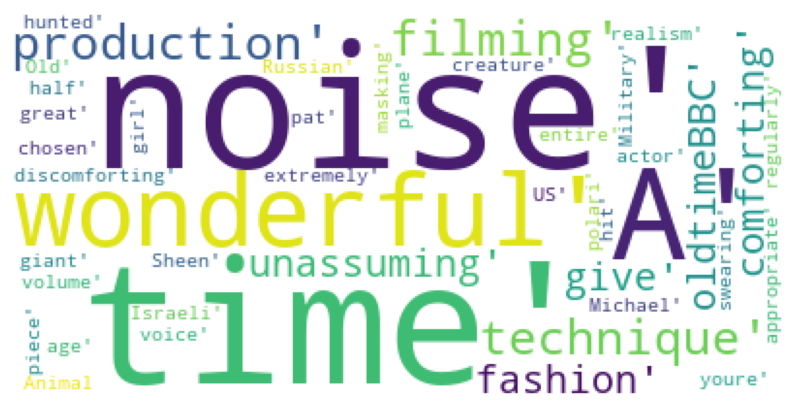

In [81]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordCloud)
plt.axis('off')
plt.show()

## Counting the number of times a word has repeated through out the data.

In [82]:
tokens_without_sw = (str(tokens_without_sw))

In [83]:
# Removing stopwords as creating two lists to display the words and their counts
filtered_words = [word for word in tokens_without_sw.split() if word not in stopwords]
cunted_words = collections.Counter(filtered_words)

words = []
counts = []

for letter, count in cunted_words.most_common(10):
    words.append(letter)
    counts.append(count)



In [84]:
cunted_words.most_common(100)

[('"\'",', 6),
 ("'.',", 5),
 ("'``',", 2),
 ('"\'\'",', 2),
 ('"\'The",', 2),
 ("'time',", 2),
 ("'noise',", 2),
 ("['[',", 1),
 ("'[',", 1),
 ("'A',", 1),
 ("'wonderful',", 1),
 ("'production',", 1),
 ("'filming',", 1),
 ("'technique',", 1),
 ("'unassuming',", 1),
 ("'oldtimeBBC',", 1),
 ("'fashion',", 1),
 ("'give',", 1),
 ("'comforting',", 1),
 ("'discomforting',", 1),
 ("'realism',", 1),
 ("'entire',", 1),
 ("'piece',", 1),
 ("'actor',", 1),
 ("'extremely',", 1),
 ("'chosen',", 1),
 ("'Michael',", 1),
 ("'Sheen',", 1),
 ("'polari',", 1),
 ("'voice',", 1),
 ("'pat',", 1),
 ("'!',", 1),
 ("'...',", 1),
 ('"\'Any",', 1),
 ("'youre',", 1),
 ("'hunted',", 1),
 ("'giant',", 1),
 ("'creature',", 1),
 ("'great',", 1),
 ("'hit',", 1),
 ("'girl',", 1),
 ("'half',", 1),
 ("'age',", 1),
 ('"\'Animal",', 1),
 ("'appropriate',", 1),
 ("'masking',", 1),
 ("'swearing',", 1),
 ("'volume',", 1),
 ("'Old',", 1),
 ("'Israeli',", 1),
 ("'Russian',", 1),
 ("'plane',", 1),
 ("'regularly',", 1),
 ("'US',

##  Visualizing top 10 repeated/common words using bar graph.

<BarContainer object of 10 artists>

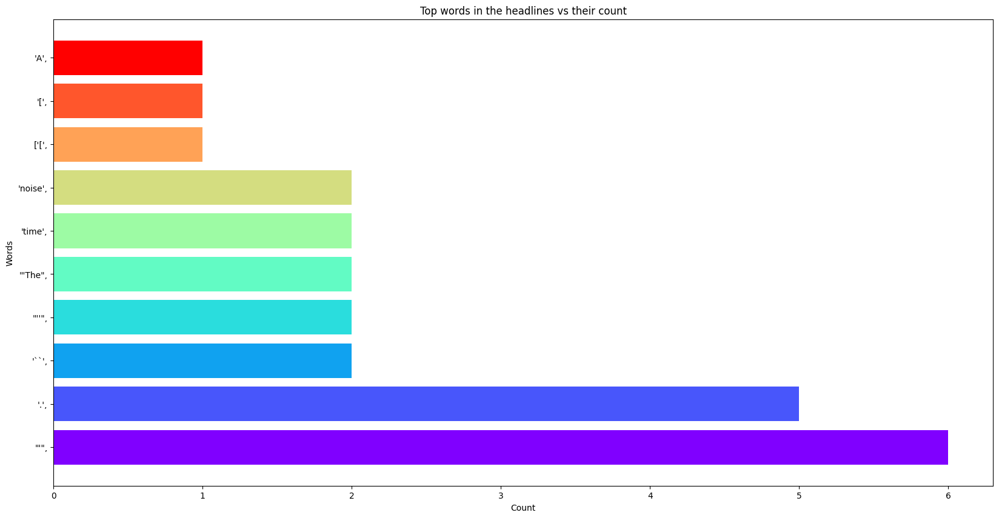

In [85]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the headlines vs their count')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

## Sentiment Analysis

# Sentiment Analysis

In [87]:
%pip install vaderSentiment

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 126.0/126.0 kB 8.5 MB/s eta 0:00:00


In [88]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer


In [89]:
sentence = tokens_without_sw
tokenized_sentence = nltk.sent_tokenize(sentence)

sid = SentimentIntensityAnalyzer()
pos_word_list = []
neu_word_list = []
neg_word_list = []

for word in tokenized_sentence:
    if (sid.polarity_scores(word)['compound']) >= 0.1:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.1:
        neg_word_list.append(word)
    else:
        neu_word_list.append(word)



### Top 100 positive word

In [90]:
print(list(iter(pos_word_list[:100])))

['[\'[\', \'``\', \'[\', "\'", \'A\', \'wonderful\', \'production\', \'.', '\', "\'", \'...\', "\'Any", \'time\', \'youre\', \'hunted\', \'giant\', \'creature\', \'great\', \'time\', \'hit\', \'girl\', \'half\', \'age\', \'.']


### Top 100 negatice word

In [91]:
print(list(iter(neg_word_list[:100])))

['\', "\'", "\'Animal", \'noise\', \'appropriate\', \'masking\', \'noise\', \'swearing\', \'volume\', \'.']


## Vader sentiment analysis for a given (Sentence) if positive, negative or  neutral in nature.

In [92]:
sid = SentimentIntensityAnalyzer()
for sentence in Text:
    print(sentence)

    ss = sid.polarity_scores(sentence)
    for k in ss:
        print('{0}: {1}, '.format(k, ss[k]), end='')
    print()

A wonderful little production . The filming technique is very unassuming very oldtimeBBC fashion and give a comforting and sometimes discomforting sense of realism to the entire piece . The actor are extremely well chosen Michael Sheen not only ha got all the polari but he ha all the voice down pat too ! You can truly see the seamless editing guided by the reference to Williams diary entry not only is it well worth the watching but it is a terrificly written and performed piece . A masterful production about one of the great master of comedy and his life . The realism really come home with the little thing : the fantasy of the guard which rather than use the traditional dream technique remains solid then disappears . It play on our knowledge and our sens particularly with the scene concerning Orton and Halliwell and the set ( particularly of their flat with Halliwells mural decorating every surface ) are terribly well done .
neg: 0.057, neu: 0.754, pos: 0.188, compound: 0.9746, 
I thou